<a href="https://colab.research.google.com/github/NJain121442/course2020/blob/master/6Sept_SEM_Conv2d_V1_M0.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install kornia
from kornia import filters
import torch.nn as nn
import glob
from torch.utils.data import Dataset, DataLoader
import torch
import torch.nn.functional as F
import torch.optim as optim
from IPython.display import clear_output
from torchvision import datasets, transforms
import numpy as np
from torchsummary import summary 
import matplotlib.image as mpimg
import torchvision
import cv2
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
from PIL import Image

     |████████████████████████████████| 204kB 2.7MB/s 


In [ ]:
#from google.colab import drive 
#drive.mount("/content/drive")

In [2]:
!unzip /content/M0_120_class_images.zip -d /content/
!unzip /content/M0_Test_Data.zip -d /content/
#!unzip /content/Test.zip -d /content/
#!unzip /content/Train.zip -d /content/

Archive:  /content/M0_120_class_images.zip
   creating: /content/M0_Selected_class_images/
  inflating: /content/M0_Selected_class_images/Defect_103973_Class_1_Internal.tiff  
  inflating: /content/M0_Selected_class_images/Defect_105326_Class_1_Internal.tiff  
  inflating: /content/M0_Selected_class_images/Defect_105665_Class_1_Internal.tiff  
  inflating: /content/M0_Selected_class_images/Defect_107357_Class_1_Internal.tiff  
  inflating: /content/M0_Selected_class_images/Defect_107695_Class_1_Internal.tiff  
  inflating: /content/M0_Selected_class_images/Defect_109387_Class_1_Internal.tiff  
  inflating: /content/M0_Selected_class_images/Defect_111079_Class_1_Internal.tiff  
  inflating: /content/M0_Selected_class_images/Defect_111418_Class_1_Internal.tiff  
  inflating: /content/M0_Selected_class_images/Defect_111756_Class_1_Internal.tiff  
  inflating: /content/M0_Selected_class_images/Defect_113786_Class_1_Internal.tiff  
  inflating: /content/M0_Selected_class_images/Defect_11421

In [ ]:
#!unzip '/content/drive/My Drive/AutoEncoder_training.zip' -d '/content/drive/My Drive/AutoEncoder_training' 

In [3]:
#Data_path = "/content/Fruits/"
#Data_path = "/content/drive/My Drive/AutoEncoder_training/AutoEncoder_training/"
#Data_path = "/content/drive/My Drive/All_class_images"
Data_path = "/content/M0_Selected_class_images"
#Data_path = "/content/Train"
Test_Data_path = "/content/M0_Test_Data"

Lets Resize all images to same size

In [4]:
class CustomDataset(Dataset):
  def __init__(self,path,new_size = 226):
    #self.filelist = glob.glob(path+'/*.jfif')
    self.filelist = glob.glob(path+'/*.tiff')
    self.new_size = new_size

  def __len__(self):
    return len(self.filelist)

  def __getitem__(self, idx):
    temp_filepath = self.filelist[idx]
    temp_image = cv2.imread(temp_filepath)
    #print(temp_image)
    #print('Original Dimensions : ',temp_image.shape)
    #cv2_imshow(temp_image)
    temp_image = cv2.cvtColor(temp_image, cv2.COLOR_BGR2GRAY)
    #print('Original Dimensions : ',temp_image.shape)
    #cv2_imshow(temp_image)
    #dim = (504,504)
    #temp_image = cv2.resize(temp_image, dim, interpolation = cv2.INTER_AREA)
    #print('Resized Dimensions : ',temp_image.shape)
    #cv2_imshow(temp_image)
    #print(temp_image.shape)
    temp_image = temp_image/255
    #plt.imshow(temp_image,cmap='gray',vmin=0,vmax=1)
    #temp_image = torch.from_numpy(temp_image)
    temp_image = torch.Tensor(temp_image)
    #print(temp_image.shape)
    #print(temp_image)
    temp_image = temp_image.unsqueeze(0)
    #print(temp_image.shape)
    return temp_image

In [5]:
Data = CustomDataset(Data_path)
Test_data = CustomDataset(Test_Data_path)
Data[2].shape

torch.Size([1, 504, 504])

In [10]:
latent_dim = 128

class Encoder(nn.Module):
    def __init__(self):
        super(Encoder,self).__init__()
        self.enc1 = nn.Conv2d(1,64,kernel_size=3,stride=3)
        self.enc2 = nn.Conv2d(64,128,kernel_size=3,stride=3)
        self.enc3 = nn.Conv2d(128,256,kernel_size=2,stride=2)
        self.enc4 = nn.Conv2d(256,128,kernel_size=3,stride=2)
        self.enc5 = nn.Conv2d(128,latent_dim,kernel_size=3,stride=1)
        self.pool = nn.MaxPool2d(2,2,return_indices=True)

    def forward(self,x):
        conv1 = F.relu(self.enc1(x)) # output will be 168x168x64
        x,indices1 = self.pool(conv1) #output will be 84x84x64
        conv2 = F.relu(self.enc2(x)) #output will be 28x28x128
        x,indices2 = self.pool(conv2)   # output will be 14x14x128
        conv3 = F.relu(self.enc3(x)) #output will be 5x5x256 
        x = F.relu(self.enc4(conv3))
        x = F.relu(self.enc5(x))
        return x,indices1,indices2,conv3,conv2,conv1
    
class Decoder(nn.Module):
    def __init__(self):
        super(Decoder,self).__init__()
        self.dec1 = nn.ConvTranspose2d(latent_dim,128,kernel_size=3,stride=1)
        self.dec2 = nn.ConvTranspose2d(128,256,kernel_size=3,stride=2)
        self.dec3 = nn.ConvTranspose2d(256,128, kernel_size=2, stride=2)  
        self.dec4 = nn.ConvTranspose2d(128,64, kernel_size=3, stride=3)
        self.dec5 = nn.ConvTranspose2d(64 ,1, kernel_size=3, stride=3)

        self.unpool = nn.MaxUnpool2d(2,2,padding=0)
        
        
    def forward(self,x,indices1,indices2,conv3,conv2,conv1):
        x = F.relu(self.dec1(x))
        x = F.relu(self.dec2(x))
        x = F.relu(self.dec3(x)) # ouput will be 14x14x128
        x = self.unpool(x,indices2) #output will be 28x28x128
        x = F.relu(self.dec4(x)) # output will be 84x84x64
        x = self.unpool(x,indices1) #output will be 168x168x64
        #x = self.dec3(x) # output will be 504x504x1
        x = torch.sigmoid(self.dec5(x)) # output will be 504x504x1
        return x
    
class Conv2d_AutoEncoder(nn.Module):
    def __init__(self):
        super(Conv2d_AutoEncoder, self).__init__()

        self.enc = Encoder()
        self.dec = Decoder()

    def forward(self, x):
        
        z,indices1,indices2,conv3,conv2,conv1 = self.enc(x)
        
        out = self.dec(z,indices1,indices2,conv3,conv2,conv1)
        
        return out

**Lets write the first Auto encoder **

In [11]:
net = Conv2d_AutoEncoder()
print(net)
if torch.cuda.is_available():
    net.cuda()
summary(net,input_size=(1,504,504))

Conv2d_AutoEncoder(
  (enc): Encoder(
    (enc1): Conv2d(1, 64, kernel_size=(3, 3), stride=(3, 3))
    (enc2): Conv2d(64, 128, kernel_size=(3, 3), stride=(3, 3))
    (enc3): Conv2d(128, 256, kernel_size=(2, 2), stride=(2, 2))
    (enc4): Conv2d(256, 128, kernel_size=(3, 3), stride=(2, 2))
    (enc5): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1))
    (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (dec): Decoder(
    (dec1): ConvTranspose2d(128, 128, kernel_size=(3, 3), stride=(1, 1))
    (dec2): ConvTranspose2d(128, 256, kernel_size=(3, 3), stride=(2, 2))
    (dec3): ConvTranspose2d(256, 128, kernel_size=(2, 2), stride=(2, 2))
    (dec4): ConvTranspose2d(128, 64, kernel_size=(3, 3), stride=(3, 3))
    (dec5): ConvTranspose2d(64, 1, kernel_size=(3, 3), stride=(3, 3))
    (unpool): MaxUnpool2d(kernel_size=(2, 2), stride=(2, 2), padding=(0, 0))
  )
)
----------------------------------------------------------------
        Layer (type)        

In [12]:
train_loader = DataLoader(Data,batch_size=1)

In [13]:
loss_func = nn.MSELoss()
#loss_func = nn.L1Loss()
optimizer = optim.Adam(net.parameters(), lr=0.0001) 


Training the Auto encoder

In [14]:
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt

n_epochs = 200

if torch.cuda.is_available():
    net.cuda()

total_loss = []
epoch_loss = 0
net.train()
for epoch in tqdm(range(n_epochs)):
    print("current epoch is:",epoch)
    epoch_loss = 0
    for x in train_loader:
        mse_loss = 0
        loss_der = 0
        if torch.cuda.is_available():
          x = x.cuda()
        optimizer.zero_grad()
        prediction = net(x)
        SpatialGradient = filters.SpatialGradient()
        loss_der = loss_func(SpatialGradient(prediction), SpatialGradient(x))
        mse_loss = loss_func(prediction, x) 
        (mse_loss+loss_der).backward()
        optimizer.step()
        epoch_loss = epoch_loss + mse_loss.item() + loss_der.item()

    total_loss.append(epoch_loss)
    print('Loss Per epoch: ',epoch_loss)
    

current epoch is: 0
Loss Per epoch:  8.809294242295437
current epoch is: 1
Loss Per epoch:  7.502280022483319
current epoch is: 2
Loss Per epoch:  6.853723478619941
current epoch is: 3
Loss Per epoch:  6.430703332298435
current epoch is: 4
Loss Per epoch:  6.166731421137229
current epoch is: 5
Loss Per epoch:  5.97650153178256
current epoch is: 6
Loss Per epoch:  5.828077238169499
current epoch is: 7
Loss Per epoch:  5.682352564530447
current epoch is: 8
Loss Per epoch:  5.546526657999493
current epoch is: 9
Loss Per epoch:  5.4392032127361745
current epoch is: 10
Loss Per epoch:  5.348084696801379
current epoch is: 11
Loss Per epoch:  5.267060514190234
current epoch is: 12
Loss Per epoch:  5.193677096161991
current epoch is: 13
Loss Per epoch:  5.126963997841813
current epoch is: 14
Loss Per epoch:  5.076859099906869
current epoch is: 15
Loss Per epoch:  5.029770586756058
current epoch is: 16
Loss Per epoch:  4.970375703531317
current epoch is: 17
Loss Per epoch:  4.902506393264048
cu

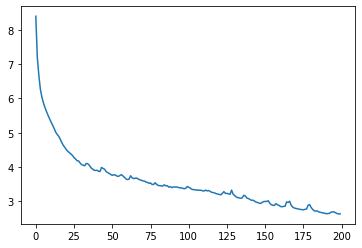

In [ ]:
import matplotlib.pyplot as plt
plt.plot(total_loss)

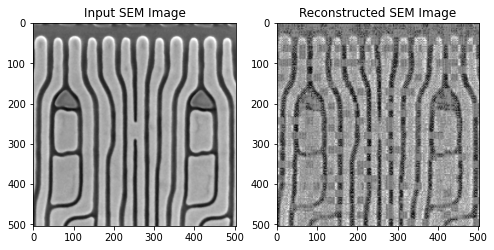

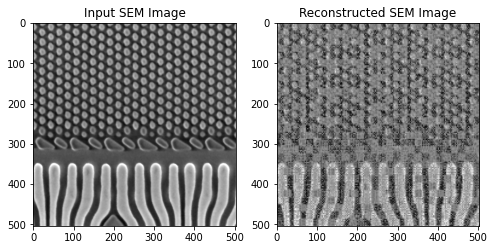

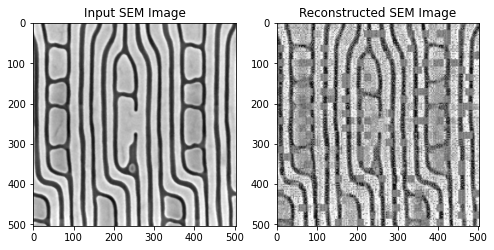

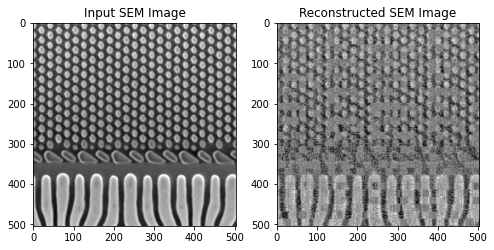

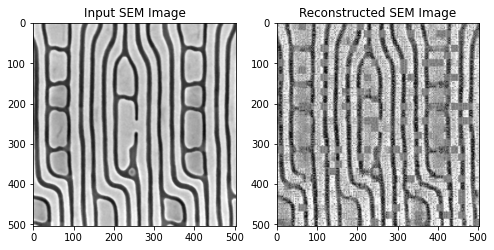

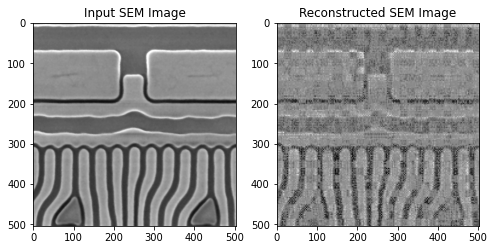

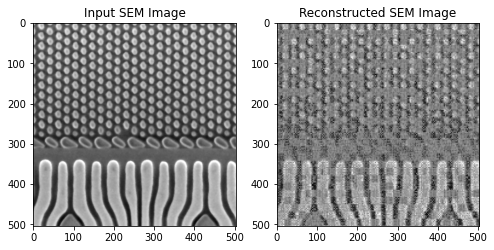

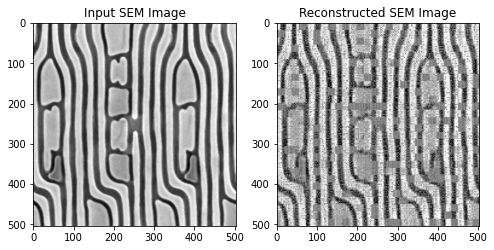

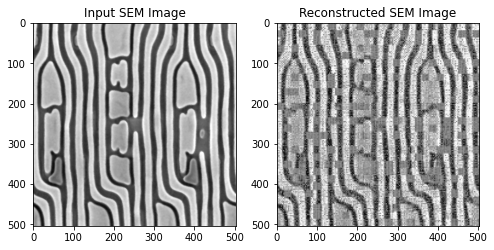

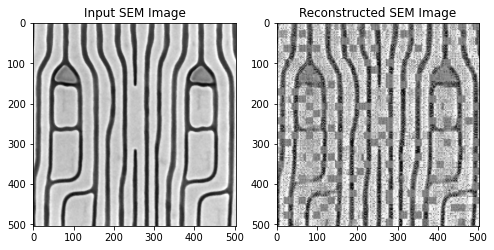

In [15]:
net.cpu()
net.eval()
counter = 0
for i in range(10):
    counter = counter + 1
    fig,ax = plt.subplots(1,2,figsize=(8,4))
    x = Data[i]
    input_img = x[0]
    #print(input_img)
    model_pred = net(x.unsqueeze(0))[0].cpu().data.numpy()[0]
    #print(model_pred)
    ax[0].set_title('Input SEM Image',fontsize=12)
    ax[1].set_title('Reconstructed SEM Image',fontsize=12)
    ax[0].imshow(input_img,cmap='gray',vmin=0,vmax=1)
    ax[1].imshow(model_pred,cmap='gray',vmin=0,vmax=1)


Extract Latent representation from Encoder 

Do Clustering and calculate Silhouette Score

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn import preprocessing
Encoder_net = Encoder()
Attributes = np.empty([len(train_loader),latent_dim])

#print(Attributes.shape)
for i,x in enumerate(Data):
  Temp_results = Encoder_net(x.unsqueeze(0))
  #print(Temp_results[0])
  Temp_Attributes = (Temp_results[0]).cpu().data.numpy()
  #print("Temp_Attributes:",Temp_Attributes)
  Attributes[i] = Temp_Attributes
  #print(Attributes[i].shape)
print(Attributes)


[[0.         0.02186232 0.03377905 ... 0.         0.01644981 0.        ]
 [0.         0.02141462 0.03236847 ... 0.         0.01450837 0.        ]
 [0.         0.02085757 0.03476119 ... 0.         0.01417119 0.        ]
 ...
 [0.         0.0189404  0.03301505 ... 0.         0.01525502 0.        ]
 [0.         0.02141812 0.03438106 ... 0.         0.01573735 0.        ]
 [0.         0.02214528 0.0352333  ... 0.         0.01528175 0.        ]]


In [ ]:


#On test set
Attributes_Test = np.empty([len(Test_data),128])
#print(Attributes.shape)
for i,x in enumerate(Test_data):
  Temp_results1 = Encoder_net(x.unsqueeze(0))
  #print(Temp_results[0])
  Temp_Attributes1 = (Temp_results1[0]).cpu().data.numpy()
  #print("Temp_Attributes:",Temp_Attributes)
  Attributes_Test[i] = Temp_Attributes1
  #print(Attributes[i].shape)
#print(Attributes.shape)

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


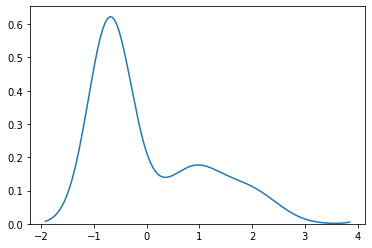

In [ ]:
Attributes.shape
Attributes_scaled = preprocessing.scale(Attributes)
from sklearn.feature_selection import VarianceThreshold
selector = VarianceThreshold()
Attributes_scaled2 = selector.fit_transform(Attributes_scaled)

# import pandas as pd
import numpy as np
np.savetxt('ScaledAttr2.txt',Attributes_scaled2)

import seaborn as sns
sns.kdeplot(Attributes_scaled2[:,4])

In [ ]:
# Attributes_scaled2.shape
# import seaborn as sns
# for i in range(70):
#   sns.kdeplot(Attributes_scaled2[:,i])
# # Attributes_scaled2[1,:]

In [ ]:
from sklearn.feature_selection import VarianceThreshold
k=10
Attributes_scaled = preprocessing.scale(Attributes)
print(Attributes_scaled.shape)
#print(Attributes_scaled.mean(axis=0))
print(Attributes_scaled.std(axis=0))
selector = VarianceThreshold()
Attributes_scaled = selector.fit_transform(Attributes_scaled)
print(Attributes_scaled.shape)
#print(Attributes_scaled.mean(axis=0))
print(Attributes_scaled.std(axis=0))
kmeans = KMeans(n_clusters=k,random_state=0).fit(Attributes_scaled)
Clustering_labels = kmeans.labels_
print(Clustering_labels)
Score = silhouette_score(Attributes_scaled,Clustering_labels,metric='euclidean')
print(Score)
sample_score = silhouette_samples(Attributes_scaled,Clustering_labels,metric='euclidean')
#print(sample_score)

(120, 128)
[0. 1. 1. 0. 0. 0. 1. 0. 1. 1. 0. 0. 0. 0. 0. 1. 1. 0. 1. 0. 0. 1. 1. 1.
 1. 0. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 1. 0. 0. 1. 1. 1. 1. 0. 0. 0. 1. 0.
 0. 1. 1. 0. 1. 0. 0. 0. 1. 0. 0. 1. 0. 1. 1. 0. 0. 1. 1. 1. 1. 0. 1. 0.
 1. 0. 1. 0. 1. 1. 0. 0. 1. 0. 0. 1. 0. 1. 1. 1. 1. 1. 0. 1. 1. 0. 0. 0.
 0. 1. 1. 1. 1. 0. 0. 1. 0. 0. 1. 1. 1. 0. 1. 0. 1. 0. 0. 0. 0. 1. 1. 1.
 1. 1. 0. 1. 0. 0. 1. 0.]
(120, 67)
[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
[4 9 7 0 7 0 8 6 3 2 6 1 7 4 2 7 5 3 5 9 4 7 5 7 3 7 2 4 4 3 4 4 3 3 2 1 5
 1 7 5 0 7 4 7 8 5 3 4 2 4 1 5 3 3 5 0 1 4 4 6 7 3 7 2 5 4 4 3 1 9 8 9 7 4
 9 3 5 1 5 0 1 8 1 9 9 4 7 7 2 8 4 8 7 2 3 8 1 7 4 8 9 2 7 9 4 4 1 3 3 6 5
 3 5 3 1 1 3 8 1 0]
0.150438834551415


In [ ]:
print(Score)

0.150438834551415


In [ ]:
#Plot TSNE 
#print(X_embedded)
from sklearn.manifold import TSNE
X_embedded = TSNE(n_components=2).fit_transform(Attributes_scaled)




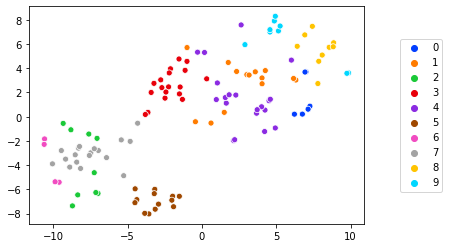

In [ ]:
import pandas as pd
type(X_embedded)
type(Clustering_labels)
df111 = pd.DataFrame(X_embedded, columns = ['X1','X2'])
# df111[['X1','X2']] = X_embedded
df111['L'] = Clustering_labels

# import seaborn as sns
# sns.color_palette("bright", 10)
# sns.scatterplot(x='X1',y='X2',hue='L',data=df111,legend='full')

palette = sns.color_palette("bright", 10)  #Choosing color
g = sns.scatterplot(X_embedded[:, 0], X_embedded[:, 1], palette=palette, hue=Clustering_labels, legend='full')
g.legend(loc='right', bbox_to_anchor=(1.25, 0.5), ncol=1)
plt.show()

In [ ]:
#On Test Data
k = 10
Attributes_Test_scaled = preprocessing.scale(Attributes_Test)
kmeans_Test = KMeans(n_clusters=k).fit(Attributes_Test_scaled)
Clustering_labels_Test = kmeans_Test.labels_
print(Clustering_labels_Test)
Score_Test = silhouette_score(Attributes_Test_scaled,Clustering_labels_Test,metric='euclidean')
print(Score_Test)
sample_score_Test = silhouette_samples(Attributes_Test_scaled,Clustering_labels_Test,metric='euclidean')

[3 0 1 7 6 0 8 8 6 0 2 6 7 9 7 6 6 3 4 2 8 7 7 2 4 4 5 0 4 4 7 6 4 3 5 5 4
 4 8 4 3 4 4 1 5 5 9 7 7 6 7 4 5 5 4 2 4 1 4 8 7 1 8 2 8 0 8 0 2 7 9 0 0 2
 4 0 8 4 6 2 8 3 4 7 2 0 7 0 7 4 8 5 4 4 6 7 5 8 2 7]
0.1448046136167507


In [ ]:
max(sample_score)

0.4322718670593178

Find Optimal K using Silhouette score

In [ ]:
import pandas as pd 
column_names = ["Image","Label","Score"]
df = pd.DataFrame(columns = column_names,index=np.arange(len(Data)))
df['Image'][88]

for i,x in enumerate(Data):
  df['Image'][i] = (x[0]).data.numpy()
  df['Label'][i] = Clustering_labels[i]
  df['Score'][i] = sample_score[i]
  #print(input_img)
  df

#   df.to_csv('Scores.csv')

In [ ]:
df_Test = pd.DataFrame(columns = column_names,index=np.arange(len(Test_data)))
df_Test['Image'][48]
for i,x in enumerate(Test_data):
  df_Test['Image'][i] = (x[0]).data.numpy()
  df_Test['Label'][i] = Clustering_labels_Test[i]
  df_Test['Score'][i] = sample_score_Test[i]
  #print(input_img)
df_Test

,Image,Label,Score
0,"[[0.5686275, 0.5372549, 0.4862745, 0.43137255,...",3,0.290045
1,"[[1.0, 0.9843137, 0.9254902, 0.8784314, 0.8509...",0,0.158331
2,"[[0.61960787, 0.627451, 0.63529414, 0.6392157,...",1,0.159619
3,"[[0.42745098, 0.5372549, 0.7490196, 0.8980392,...",7,0.263346
4,"[[0.827451, 0.827451, 0.81960785, 0.8, 0.74509...",6,0.0848095
...,...,...,...
95,"[[0.38431373, 0.44705883, 0.5647059, 0.6980392...",7,0.345379
96,"[[0.87058824, 0.79607844, 0.57254905, 0.380392...",5,0.242658
97,"[[0.0627451, 0.07450981, 0.101960786, 0.160784...",8,-0.0487822
98,"[[0.90588236, 0.9137255, 0.93333334, 0.9568627...",2,-0.0323803


In [ ]:
# df= df.sort_values('Label',ignore_index=True)
df = df.sort_values(["Label", "Score"], ascending = (True, False),ignore_index=True)
print(df)
df['Image'][110]

                                                 Image Label     Score
0    [[0.73333335, 0.54509807, 0.38431373, 0.309803...     0  0.284246
1    [[0.41568628, 0.34509805, 0.2784314, 0.2392156...     0  0.280175
2    [[0.83137256, 0.6392157, 0.44313726, 0.3294117...     0  0.187098
3    [[0.8627451, 0.6745098, 0.47058824, 0.38431373...     0  0.176749
4    [[0.14901961, 0.13333334, 0.13333334, 0.160784...     0  0.153367
..                                                 ...   ...       ...
115  [[0.9882353, 0.972549, 0.9411765, 0.90588236, ...     9  0.307889
116  [[1.0, 1.0, 0.9607843, 0.9019608, 0.8784314, 0...     9  0.306988
117  [[0.93333334, 0.92156863, 0.8901961, 0.8588235...     9    0.2498
118  [[0.9529412, 0.94509804, 0.92941177, 0.9098039...     9   0.13414
119  [[0.91764706, 0.8901961, 0.8666667, 0.8509804,...     9  0.060412

[120 rows x 3 columns]


array([[0.22745098, 0.23529412, 0.25490198, ..., 0.87058824, 0.85882354,
        0.8509804 ],
       [0.23137255, 0.23921569, 0.25882354, ..., 0.87058824, 0.85882354,
        0.85882354],
       [0.22745098, 0.23529412, 0.25882354, ..., 0.85882354, 0.85882354,
        0.8627451 ],
       ...,
       [0.25490198, 0.2627451 , 0.28235295, ..., 0.33333334, 0.3254902 ,
        0.32156864],
       [0.24705882, 0.25882354, 0.2784314 , ..., 0.3372549 , 0.33333334,
        0.32156864],
       [0.24313726, 0.25490198, 0.28235295, ..., 0.34117648, 0.3372549 ,
        0.32156864]], dtype=float32)

In [ ]:
df_Test= df_Test.sort_values(["Label", "Score"], ascending = (True, False),ignore_index=True)
print(df_Test)
df_Test['Image'][40]

                                                Image Label      Score
0   [[0.96862745, 0.9607843, 0.9490196, 0.9372549,...     0   0.190685
1   [[1.0, 0.9843137, 0.9254902, 0.8784314, 0.8509...     0   0.158331
2   [[1.0, 1.0, 0.9607843, 0.9019608, 0.8784314, 0...     0   0.141707
3   [[1.0, 0.9882353, 0.94509804, 0.90588236, 0.87...     0   0.139998
4   [[0.9607843, 0.94509804, 0.9254902, 0.90588236...     0   0.119527
..                                                ...   ...        ...
95  [[0.0627451, 0.07450981, 0.101960786, 0.160784...     8 -0.0487822
96  [[0.28235295, 0.30980393, 0.3764706, 0.4823529...     8  -0.082445
97  [[0.5568628, 0.56078434, 0.57254905, 0.5843137...     9   0.448682
98  [[0.5254902, 0.53333336, 0.5529412, 0.5647059,...     9   0.437393
99  [[0.6117647, 0.5882353, 0.5372549, 0.42352942,...     9    0.28851

[100 rows x 3 columns]


array([[0.6509804 , 0.64705884, 0.6509804 , ..., 0.67058825, 0.67058825,
        0.6745098 ],
       [0.6392157 , 0.6392157 , 0.6431373 , ..., 0.67058825, 0.67058825,
        0.6745098 ],
       [0.63529414, 0.63529414, 0.6392157 , ..., 0.67058825, 0.67058825,
        0.67058825],
       ...,
       [0.6431373 , 0.654902  , 0.6627451 , ..., 0.5803922 , 0.7058824 ,
        0.74509805],
       [0.6431373 , 0.654902  , 0.6627451 , ..., 0.59607846, 0.7137255 ,
        0.7490196 ],
       [0.6431373 , 0.654902  , 0.6627451 , ..., 0.6117647 , 0.7176471 ,
        0.7490196 ]], dtype=float32)

120


<function matplotlib.pyplot.show>

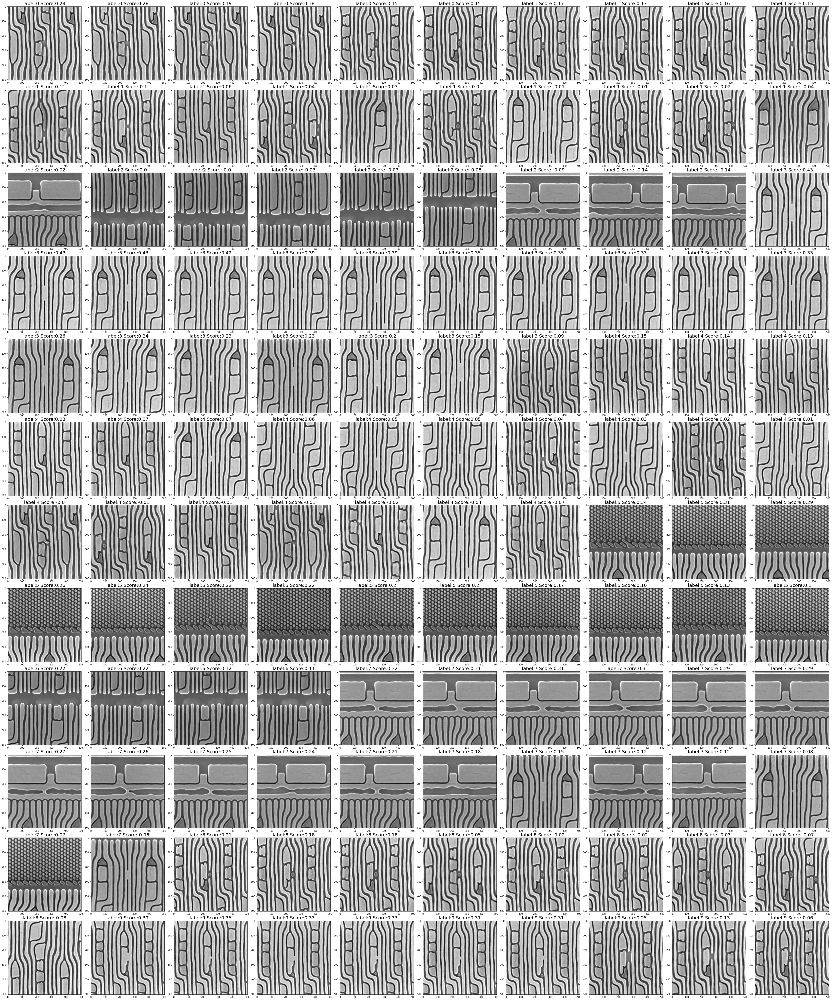

In [ ]:
ncols = 10
print(len(Data))
nrows = int(len(Data)/ncols)
figsize = [50, 60]  
fig,ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)
axi = ax.flat
#print(len(axi))
for i,x in enumerate(Data):
  input_img = df['Image'][i]
  axi[i].set_title("label:"+str(df['Label'][i])+" "+"Score:"+str(round(df['Score'][i],2)),fontsize =20)
  axi[i].imshow(input_img,cmap='gray',vmin=0,vmax=1)
fig.tight_layout(pad=0.3)
plt.show

120


<function matplotlib.pyplot.show>

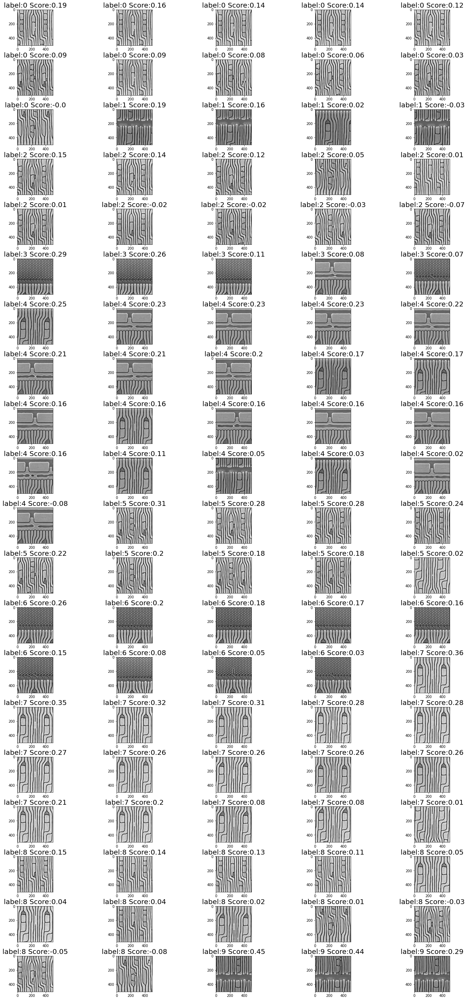

In [ ]:
#Plot test Data
ncols = 5
print(len(Data))
nrows = int(len(Test_data)/ncols)
figsize = [20, 40]  
fig,ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)
axi = ax.flat
#print(len(axi))
for i,x in enumerate(Test_data):
  input_img1 = df_Test['Image'][i]
  axi[i].set_title("label:"+str(df_Test['Label'][i])+" "+"Score:"+str(round(df_Test['Score'][i],2)),fontsize =20)
  axi[i].imshow(input_img1,cmap='gray',vmin=0,vmax=1)
fig.tight_layout(pad=0.3)
plt.show

In [ ]:
k_range = range(4,14)
Distortions = []
Silhouette_Scores = []
for k in k_range:
  kmeans = KMeans(n_clusters=k,random_state=0).fit(Attributes_scaled)
  Clustering_labels_k = kmeans.labels_
  Distortions.append(kmeans.inertia_)
  Score = silhouette_score(Attributes_scaled,Clustering_labels_k,metric='euclidean')
  Silhouette_Scores.append(Score)

Text(0.5, 1.0, 'The Silhouette score showing optimal k')

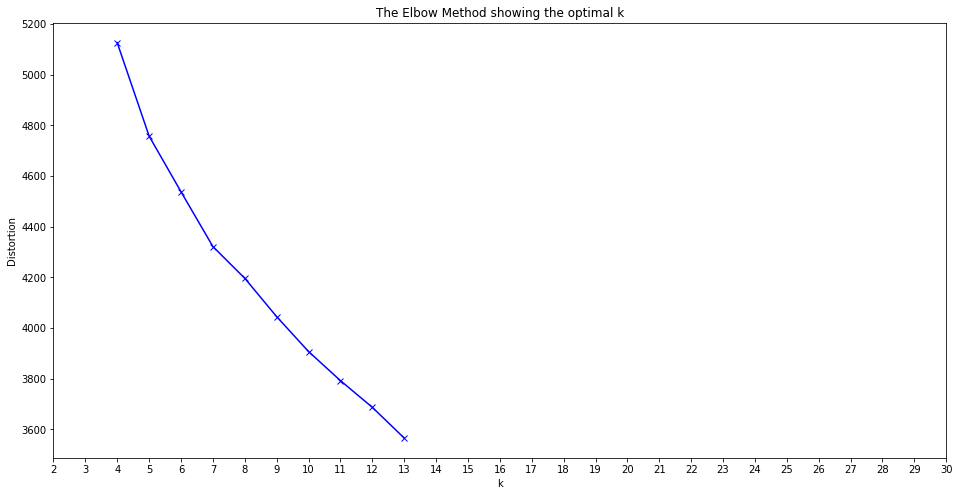

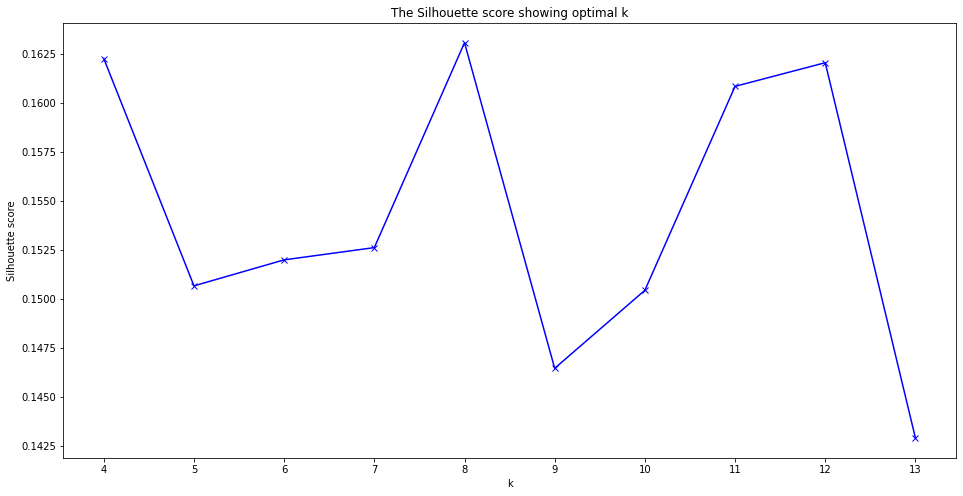

In [ ]:
#Plotting the distortions of K-Means
plt.figure(figsize=(16,8))
plt.plot(k_range, Distortions, 'bx-')
plt.xlabel('k')
plt.xticks(range(2,31))
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
#Plotting the Silhouette score of K-Means
plt.figure(figsize=(16,8))
plt.plot(k_range, Silhouette_Scores, 'bx-')
plt.xlabel('k')
plt.xticks(range(4,14))
plt.ylabel('Silhouette score')
plt.title('The Silhouette score showing optimal k')